In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-may14.csv
/kaggle/input/uber-pickups-in-new-york-city/other-FHV-services_jan-aug-2015.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Prestige_B01338.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Firstclass_B01536.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Skyline_B00111.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Lyft_B02510.csv
/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-apr14.csv
/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-jul14.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Dial7_B00887.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Diplo_B01196.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Federal_02216.csv
/kaggle/input/uber-pickups-in-new-york-city/Uber-Jan-Feb-FOIL.csv
/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-jun14.csv
/kaggle/input/uber-pickups-in-new-york-city/other-Highclass_B01717.csv
/kaggle/input/uber-pickups-in-ne

# Uber New York City Data Analysis

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Uber trip data from 2014

In [3]:
#Upload and group the files
files_2014 = ['/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-may14.csv',
                '/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-apr14.csv',
                '/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-jul14.csv',
                '/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-jun14.csv',
                '/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-sep14.csv',
                '/kaggle/input/uber-pickups-in-new-york-city/uber-raw-data-aug14.csv']
df14 = pd.DataFrame()
for file in files_2014:
    df = pd.read_csv(file,encoding='utf-8')
    df14 = pd.concat([df,df14])

In [4]:
df14.head()

,Date/Time,Lat,Lon,Base
0,8/1/2014 0:03:00,40.7366,-73.9906,B02512
1,8/1/2014 0:09:00,40.7260,-73.9918,B02512
2,8/1/2014 0:12:00,40.7209,-74.0507,B02512
3,8/1/2014 0:12:00,40.7387,-73.9856,B02512
4,8/1/2014 0:12:00,40.7323,-74.0077,B02512


In [5]:
df14.shape

(4534327, 4)

In [6]:
df14.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

# DataPreprocessing

In [7]:
df14['Date/Time'] = pd.to_datetime(df14['Date/Time'],format='%m/%d/%Y %H:%M:%S')

In [8]:
df14.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [9]:
df14['month'] = df14['Date/Time'].dt.month
df14['weekday'] = df14['Date/Time'].dt.day_name()
df14['day'] = df14['Date/Time'].dt.day
df14['hour'] = df14['Date/Time'].dt.hour
df14['minute'] = df14['Date/Time'].dt.minute

In [10]:
df14

,Date/Time,Lat,Lon,Base,month,weekday,day,hour,minute
0,2014-08-01 00:03:00,40.7366,-73.9906,B02512,8,Friday,1,0,3
1,2014-08-01 00:09:00,40.7260,-73.9918,B02512,8,Friday,1,0,9
2,2014-08-01 00:12:00,40.7209,-74.0507,B02512,8,Friday,1,0,12
3,2014-08-01 00:12:00,40.7387,-73.9856,B02512,8,Friday,1,0,12
4,2014-08-01 00:12:00,40.7323,-74.0077,B02512,8,Friday,1,0,12
...,...,...,...,...,...,...,...,...,...
652430,2014-05-31 23:45:00,40.7309,-74.0014,B02764,5,Saturday,31,23,45
652431,2014-05-31 23:52:00,40.7528,-73.9798,B02764,5,Saturday,31,23,52
652432,2014-05-31 23:55:00,40.7158,-73.9519,B02764,5,Saturday,31,23,55
652433,2014-05-31 23:56:00,40.6961,-73.8997,B02764,5,Saturday,31,23,56


# Analysis Trips of Uber 

### Analysis of trips by week days

In [11]:
df14['weekday'].value_counts()

Thursday     755145
Friday       741139
Wednesday    696488
Tuesday      663789
Saturday     646114
Monday       541472
Sunday       490180
Name: weekday, dtype: int64

<AxesSubplot:xlabel='weekday', ylabel='count'>

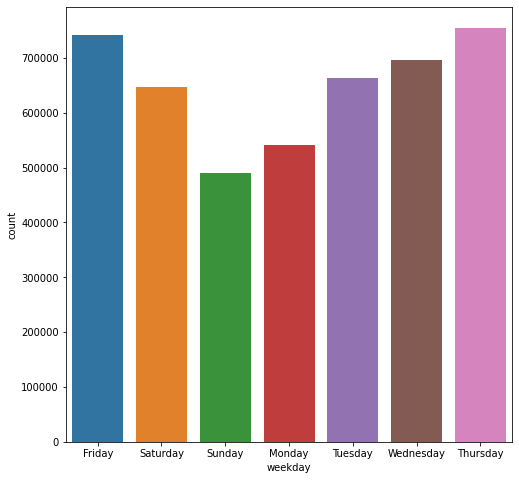

In [12]:
plt.figure(figsize=(8,8))
sns.countplot(data=df14,x='weekday')

### Analysis of trips by hours

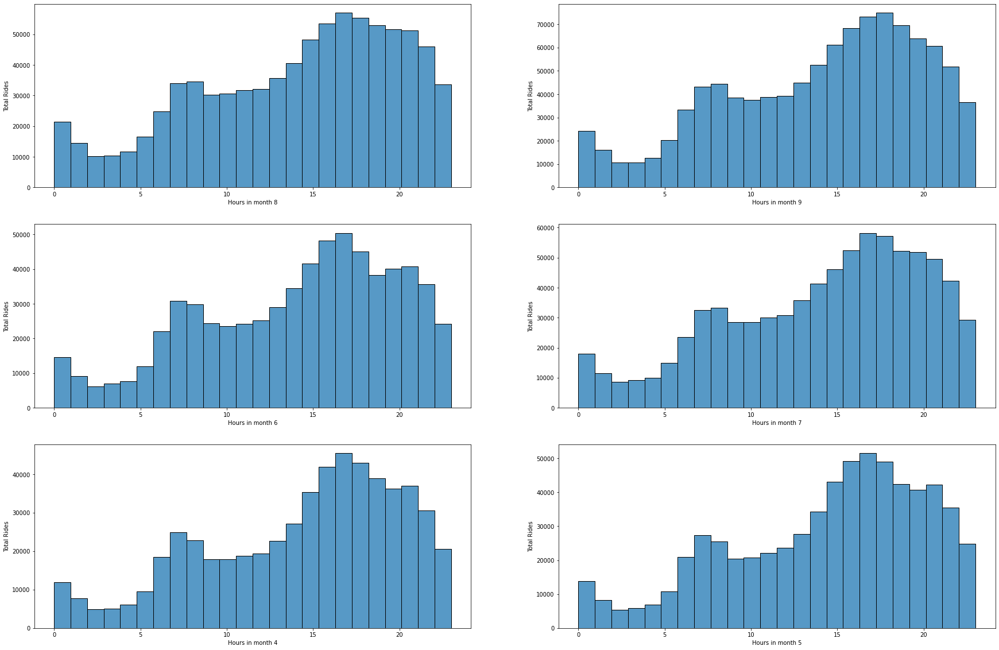

In [13]:
plt.figure(figsize=(30,20))
for i,month in enumerate(df14['month'].unique()):
    plt.subplot(3,2,i+1)
    sns.histplot(data=df14,x=df14[df14['month'] == month]['hour'],bins=24)
    plt.xlabel('Hours in month {}'.format(month))
    plt.ylabel('Total Rides')

### Analysis of which month has maximum rides

In [14]:
df14.groupby('month')['hour'].count()

month
4     564516
5     652435
6     663844
7     796121
8     829275
9    1028136
Name: hour, dtype: int64

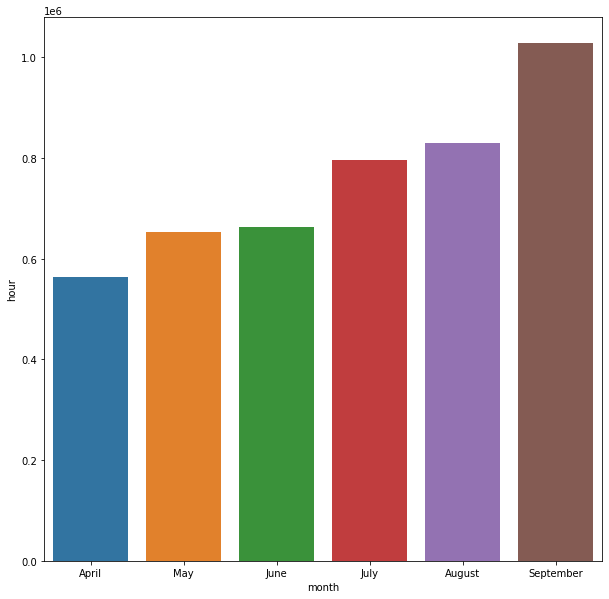

In [15]:
plt.figure(figsize=(10,10))
sns.barplot(data=df14,x=df14.groupby('month')['hour'].count().index,y=df14.groupby('month')['hour'].count())
plt.xticks(ticks=[0,1,2,3,4,5],labels=['April','May','June','July','August','September'])
plt.show()

### Analysis of trip of each day 

In [16]:
df14.groupby('day')['hour'].count()


day
1     127430
2     143201
3     142983
4     140923
5     147054
6     139886
7     143503
8     145984
9     155135
10    152500
11    148860
12    160606
13    156892
14    140148
15    153726
16    158921
17    152524
18    151319
19    153088
20    144179
21    141112
22    146952
23    156032
24    144169
25    152667
26    153405
27    145652
28    141157
29    149086
30    167160
31     78073
Name: hour, dtype: int64

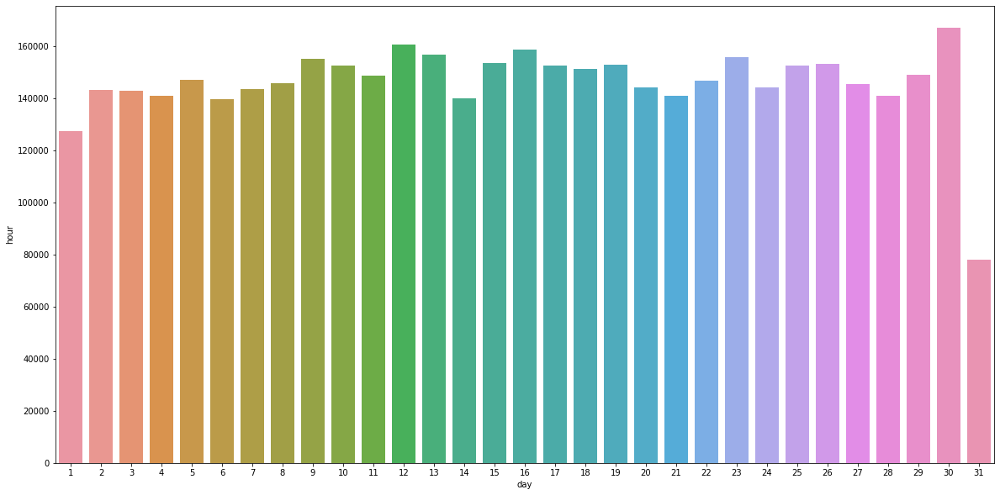

In [17]:
plt.figure(figsize=(20,10))
sns.barplot(data=df14,x=df14.groupby('day')['hour'].count().index,y=df14.groupby('day')['hour'].count())
plt.show()

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


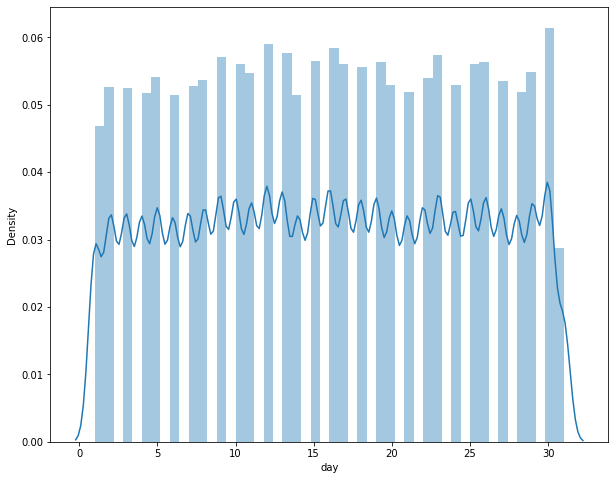

In [18]:
plt.figure(figsize=(10,8))
sns.distplot(df14['day'])
plt.show()

### Analysis of total rides month 

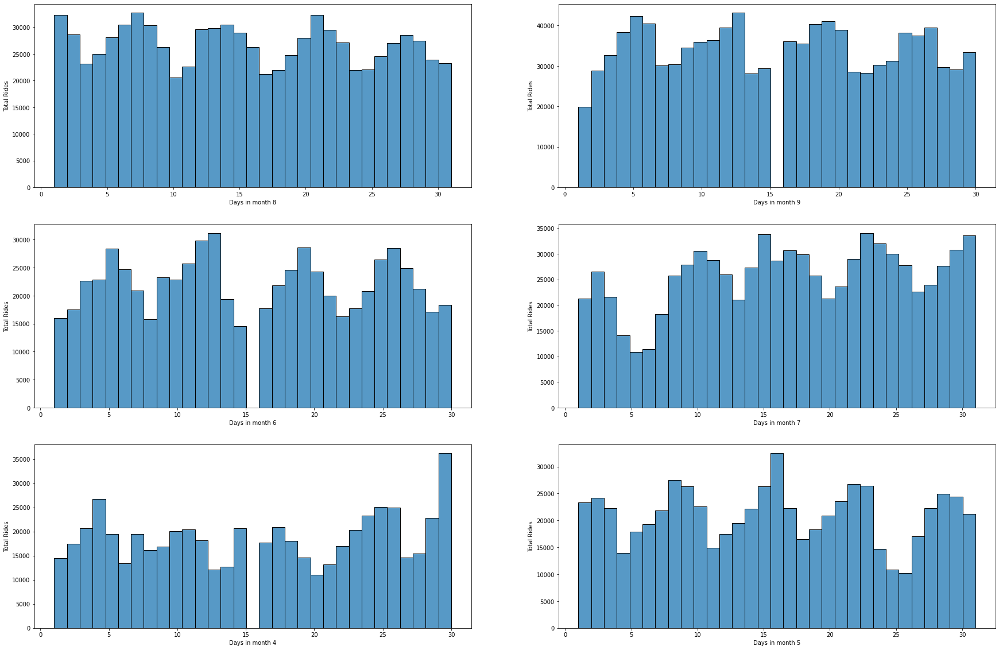

In [19]:
plt.figure(figsize=(30,20))
for i,month in enumerate(df14['month'].unique()):
    plt.subplot(3,2,i+1)
    sns.histplot(data=df14,x=df14[df14['month'] == month]['day'],bins=31)
    plt.xlabel('Days in month {}'.format(month))
    plt.ylabel('Total Rides')

### Analysing rush in hour

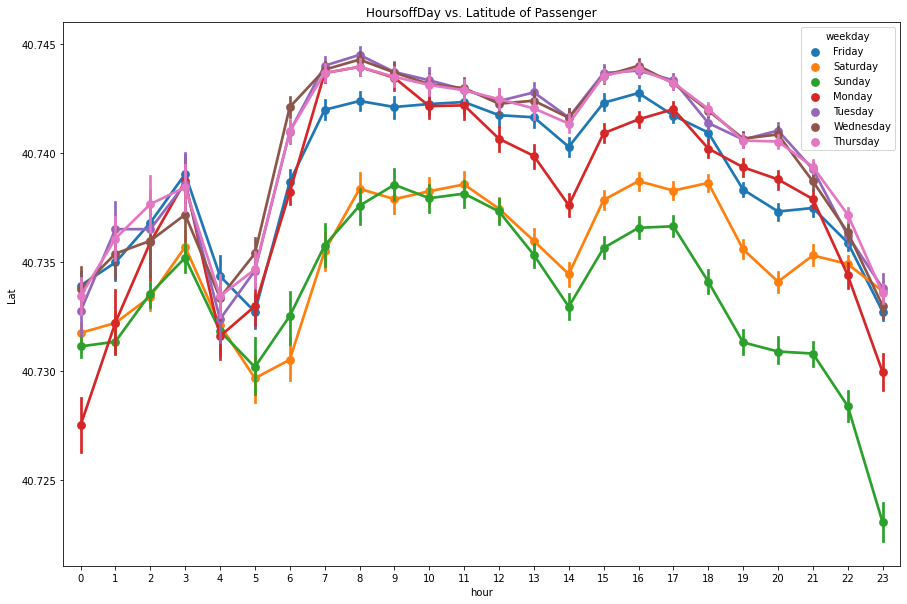

In [20]:
plt.figure(figsize=(15,10))
sns.pointplot(data=df14,x='hour',y='Lat',hue='weekday')
plt.title('HoursoffDay vs. Latitude of Passenger')
plt.show()

### Analyse which base number gets popular by month name

In [21]:
df14.head()

,Date/Time,Lat,Lon,Base,month,weekday,day,hour,minute
0,2014-08-01 00:03:00,40.7366,-73.9906,B02512,8,Friday,1,0,3
1,2014-08-01 00:09:00,40.7260,-73.9918,B02512,8,Friday,1,0,9
2,2014-08-01 00:12:00,40.7209,-74.0507,B02512,8,Friday,1,0,12
3,2014-08-01 00:12:00,40.7387,-73.9856,B02512,8,Friday,1,0,12
4,2014-08-01 00:12:00,40.7323,-74.0077,B02512,8,Friday,1,0,12


In [22]:
base = df14.groupby(['Base','month'])['Date/Time'].count().reset_index()
base

,Base,month,Date/Time
0,B02512,4,35536
1,B02512,5,36765
2,B02512,6,32509
3,B02512,7,35021
4,B02512,8,31472
5,B02512,9,34370
6,B02598,4,183263
7,B02598,5,260549
8,B02598,6,242975
9,B02598,7,245597


<AxesSubplot:xlabel='month', ylabel='Date/Time'>

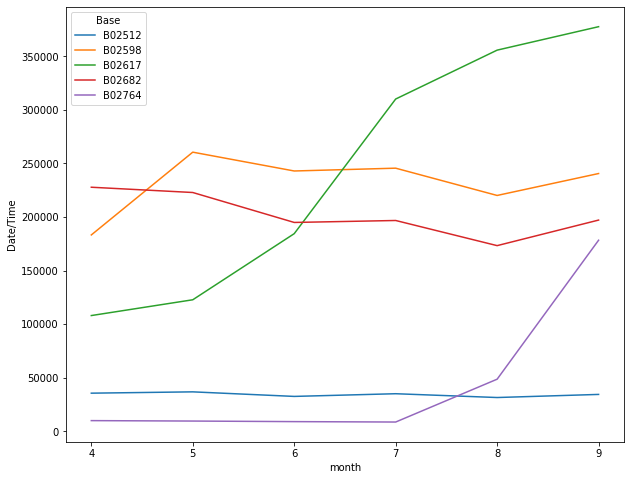

In [23]:
plt.figure(figsize=(10,8))
sns.lineplot(data=base,x='month',y='Date/Time',hue='Base')

### Perform Cross Analysis
Through my exploration i will go to visualize :

**1) HeatMap by Hour and Weekday**

**2) HeatMap by Hour and day**

**3) HeatMap by month and day**

**2) HeatMap by month and weekday**

In [24]:
def count_rows(row):
    return len(row)


def heatmap(col1,col2):
    by_cross = df14.groupby([col1,col2]).apply(count_rows)
    plt.figure(figsize=(12,8))
    sns.heatmap(by_cross.unstack())

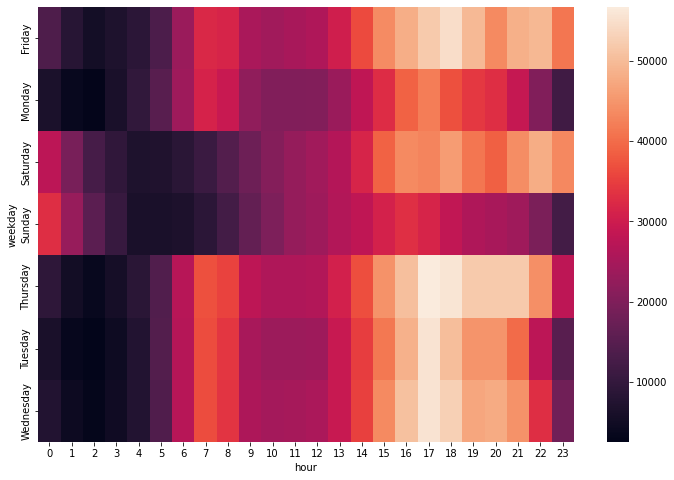

In [25]:
heatmap('weekday','hour')

Text(87.0, 0.5, 'Number of days a month')

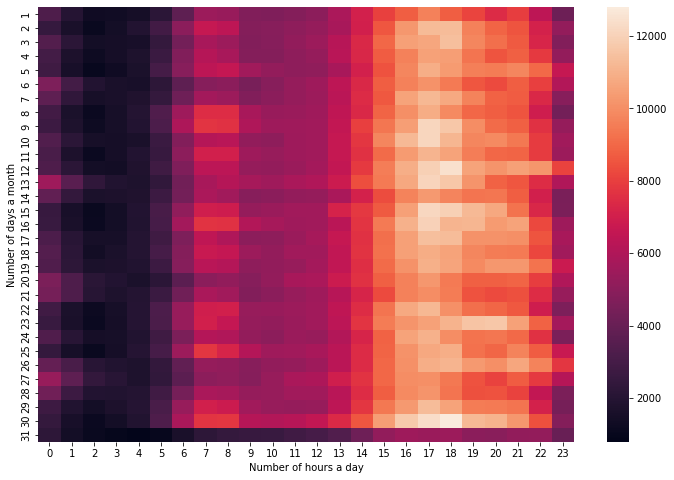

In [26]:
heatmap('day','hour')
plt.xlabel('Number of hours a day')
plt.ylabel('Number of days a month')

Text(0.5, 51.0, 'Number of days a month')

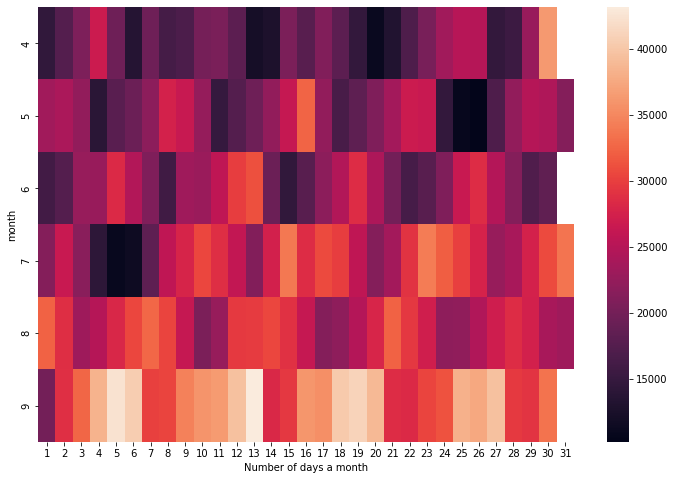

In [27]:
heatmap('month','day')
plt.xlabel('Number of days a month')

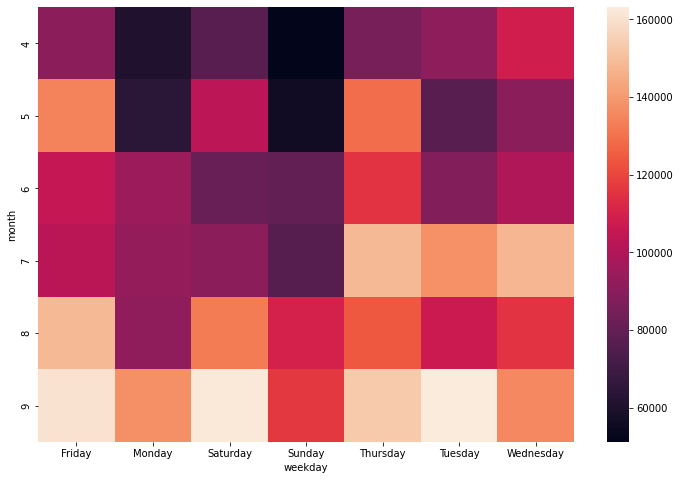

In [28]:
heatmap('month','weekday')

### Analysis of location data points

In [29]:
df14.head()

,Date/Time,Lat,Lon,Base,month,weekday,day,hour,minute
0,2014-08-01 00:03:00,40.7366,-73.9906,B02512,8,Friday,1,0,3
1,2014-08-01 00:09:00,40.7260,-73.9918,B02512,8,Friday,1,0,9
2,2014-08-01 00:12:00,40.7209,-74.0507,B02512,8,Friday,1,0,12
3,2014-08-01 00:12:00,40.7387,-73.9856,B02512,8,Friday,1,0,12
4,2014-08-01 00:12:00,40.7323,-74.0077,B02512,8,Friday,1,0,12


(40.0, 41.2)

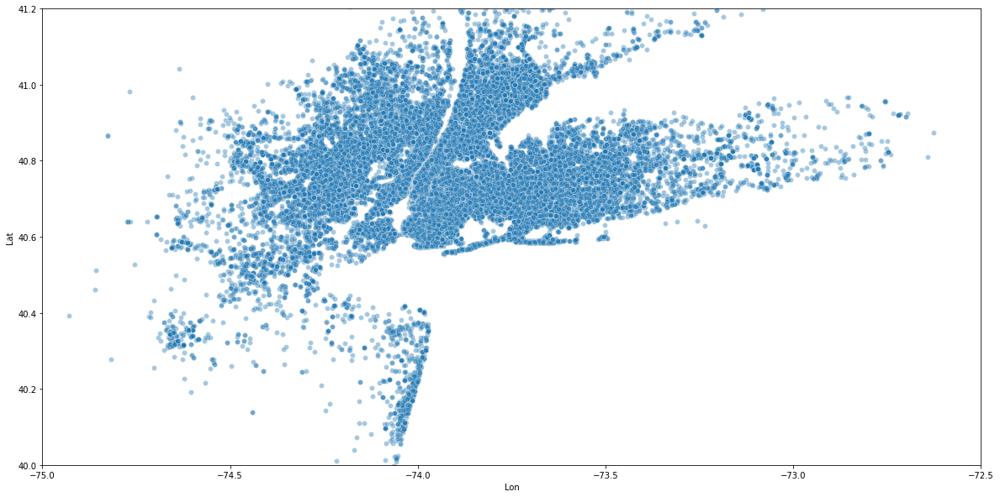

In [30]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=df14,y='Lat',x='Lon',alpha=0.4)
plt.xlim(-75,-72.5)
plt.ylim(40.0,41.2)

### Perform spatial analysis using `HeatMap` to get a clear cut of rush

In [31]:
from folium.plugins import HeatMap
import folium

def plot(day):
    df_out = df14[df14['weekday']==day]
    rush = df_out.groupby(['Lat','Lon'])['weekday'].count().reset_index()
    basemap = folium.Map()
    HeatMap(rush,zoom=20,radius=15).add_to(basemap)
    return basemap

In [32]:
plot('Sunday')

In [33]:
plot('Wednesday')

### Analysing which base number has most active vehicles in January and February 2015

In [34]:
df_foil = pd.read_csv('/kaggle/input/uber-pickups-in-new-york-city/Uber-Jan-Feb-FOIL.csv')
df_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [35]:
df_foil.dtypes

dispatching_base_number    object
date                       object
active_vehicles             int64
trips                       int64
dtype: object

In [36]:
df_foil['date'] = pd.to_datetime(df_foil['date'],format='%m/%d/%Y')

In [37]:
df_foil['dispatching_base_number'].unique()

array(['B02512', 'B02765', 'B02764', 'B02682', 'B02617', 'B02598'],
      dtype=object)

<AxesSubplot:xlabel='dispatching_base_number', ylabel='active_vehicles'>

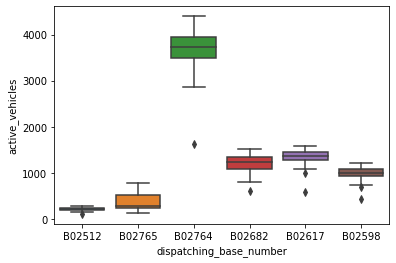

In [38]:
sns.boxplot(data=df_foil,x='dispatching_base_number',y='active_vehicles')

### Analysing which base number has most trips in January and February 2015

<AxesSubplot:xlabel='dispatching_base_number', ylabel='trips'>

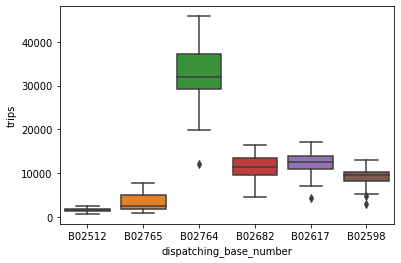

In [39]:
sns.boxplot(data=df_foil,x='dispatching_base_number',y='trips')

### How average trips/vehicles increase/decrease with dates with each of base number in January and February 2015

In [40]:
df_foil['trips/vehicles'] = df_foil['trips'] / df_foil['active_vehicles']
df_foil

,dispatching_base_number,date,active_vehicles,trips,trips/vehicles
0,B02512,2015-01-01,190,1132,5.957895
1,B02765,2015-01-01,225,1765,7.844444
2,B02764,2015-01-01,3427,29421,8.585060
3,B02682,2015-01-01,945,7679,8.125926
4,B02617,2015-01-01,1228,9537,7.766287
...,...,...,...,...,...
349,B02764,2015-02-28,3952,39812,10.073887
350,B02617,2015-02-28,1372,14022,10.220117
351,B02682,2015-02-28,1386,14472,10.441558
352,B02512,2015-02-28,230,1803,7.839130


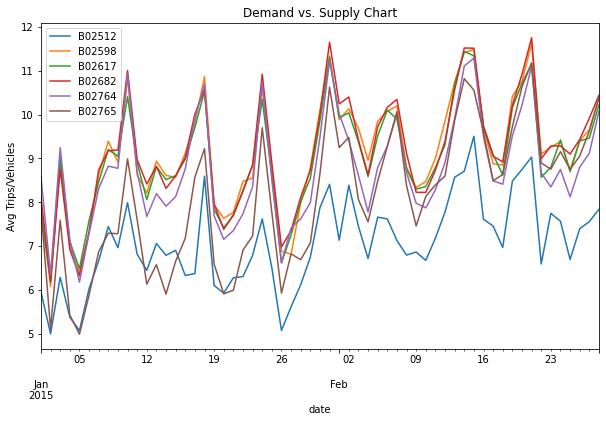

In [41]:
plt.figure(figsize=(10,6))
df_foil.set_index('date').groupby(['dispatching_base_number'])['trips/vehicles'].plot()
plt.title('Demand vs. Supply Chart')
plt.ylabel('Avg Trips/Vehicles')
plt.legend()
plt.show()